In [1]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tabulate import tabulate

In [2]:
class Orchestrator:
    def __init__(self, directory, substrings, specific_value, distance_column, status_column):
        """
        Initialization of the Orchestrator class.
        
        Parameters:
        - directory (str): Path to the directory with CSV files.
        - substrings (list): List of substrings to filter files.
        - specific_value (str): Value to filter the status_column column.
        - distance_column (str): Name of the column with distance values.
        - status_column (str): Name of the column to filter by specific_value.
        """
        self.directory = os.path.abspath(directory)
        self.substrings = substrings
        self.specific_value = specific_value
        self.distance_column = distance_column
        self.status_column = status_column
        self.dataframes = {}
        self.results = {}

    def load_csv_files(self):
        """Loads CSV files into a dictionary based on substrings."""
        os.chdir(self.directory)
        print("Loading CSV files...")
        for substring in self.substrings:
            count = 1
            for file in os.listdir(self.directory):
                if re.search(rf"{substring}(?!\d)", file) and file.endswith(".csv"):
                    var_name = f"df_{substring}_{count}"
                    self.dataframes[var_name] = pd.read_csv(os.path.join(self.directory, file))
                    print(f"Loaded {file} as {var_name}")
                    count += 1
        print(f"\nTotal number of DataFrames loaded: {len(self.dataframes)}")

    def concatenate_values(self, substring):
        """Concatenates values ​​from the distance column when the status column meets the specific value condition."""
        result_list = []
        for name, df in self.dataframes.items():
            if substring in name:
                filtered_values = df[self.distance_column][df[self.status_column] == self.specific_value].tolist()
                result_list.extend(filtered_values)
        return result_list

    def analyze_measurements(self, measurements, target_value, title_suffix=""):
        """Analyzes a list of measurements for accuracy and generates visualizations."""
        y = np.array(measurements)
        errors = y - target_value
        abs_errors = np.abs(errors)

        # Error metrics
        metrics = {
            "MAE": np.mean(abs_errors),
            "MSE": np.mean(errors ** 2),
            "RMSE": np.sqrt(np.mean(errors ** 2)),
            "MAPE": np.mean(abs_errors / target_value) * 100,
            "Max Error": np.max(abs_errors),
            "Std Error": np.std(errors)
        }

        self.visualize_results(y, errors, abs_errors, target_value, title_suffix)
        return metrics

    def visualize_results(self, y, errors, abs_errors, target_value, title_suffix):
        """Creates visualizations for analyzed results."""
        plt.figure(figsize=(14, 10))
        plt.suptitle(f"Analysis of Measurements for Goal: {target_value} ({title_suffix})", fontsize=14, fontweight='bold')
        plt.subplot(2, 2, 1)
        plt.hist(errors, bins=10, color='lightblue', edgecolor='black')
        plt.title("Histogram of Errors")
        plt.subplot(2, 2, 2)
        plt.plot(y, 'o-', label='Measurement')
        plt.axhline(target_value, color='r', linestyle='--', label='Target')
        plt.title("Actual Values vs. Target")
        plt.legend()
        plt.subplot(2, 2, 3)
        plt.plot(errors, 's-', color='orange')
        plt.title("Errors")
        plt.subplot(2, 2, 4)
        plt.boxplot(errors, vert=False)
        plt.title("Boxplot of errors")
        plt.tight_layout()
        plt.show()

    def run_analysis(self, targets):
        """Uruchamia analizę dla podanych targetów."""
        self.load_csv_files()
        for substring, target in targets.items():
            values = self.concatenate_values(substring)
            if values:
                self.results[substring] = self.analyze_measurements(values, target, title_suffix=substring)

    @staticmethod
    def compare_metrics(metrics1, metrics2):
        """Compares metrics between two result sets."""
        combined = []
        for key in set(metrics1.keys()).union(metrics2.keys()):
            row = [key, metrics1.get(key, "None"), metrics2.get(key, "None")]
            combined.append(row)
        print(tabulate(combined, headers=["Metrics", "INITF", "RESPF"], tablefmt="grid"))

Loading CSV files...
Loaded Putty_Big_100cm_initf_115200.csv as df_Putty_Big_100cm_1
Loaded Putty_Big_100cm_initf_115200_v2.csv as df_Putty_Big_100cm_2
Loaded Putty_Big_100cm_initf_115200_v3.csv as df_Putty_Big_100cm_3
Loaded Putty_Big_150cm_initf_115200.csv as df_Putty_Big_150cm_1
Loaded Putty_Big_150cm_initf_115200_v2.csv as df_Putty_Big_150cm_2
Loaded Putty_Big_150cm_initf_115200_v3.csv as df_Putty_Big_150cm_3
Loaded Putty_Big_200cm_initf_115200.csv as df_Putty_Big_200cm_1
Loaded Putty_Big_200cm_initf_115200_v2.csv as df_Putty_Big_200cm_2
Loaded Putty_Big_200cm_initf_115200_v3.csv as df_Putty_Big_200cm_3
Loaded Putty_Big_250cm_initf_115200.csv as df_Putty_Big_250cm_1
Loaded Putty_Big_250cm_initf_115200_v2.csv as df_Putty_Big_250cm_2
Loaded Putty_Big_250cm_initf_115200_v3.csv as df_Putty_Big_250cm_3
Loaded Putty_Big_300cm_initf_115200.csv as df_Putty_Big_300cm_1
Loaded Putty_Big_300cm_initf_115200_v2.csv as df_Putty_Big_300cm_2
Loaded Putty_Big_300cm_initf_115200_v3.csv as df_Putty_B

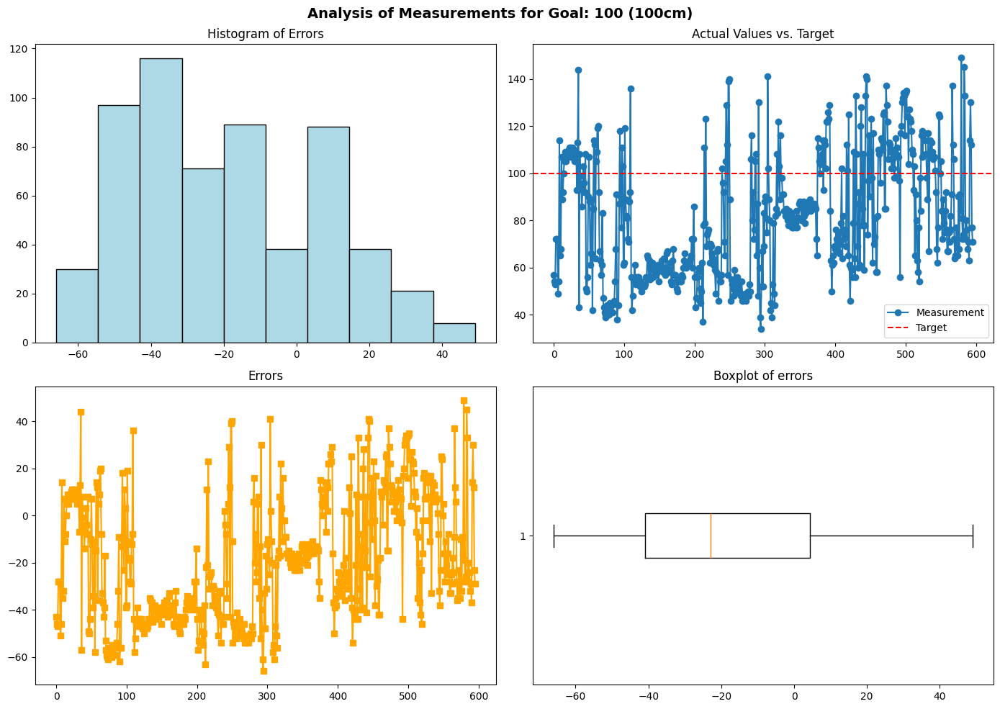

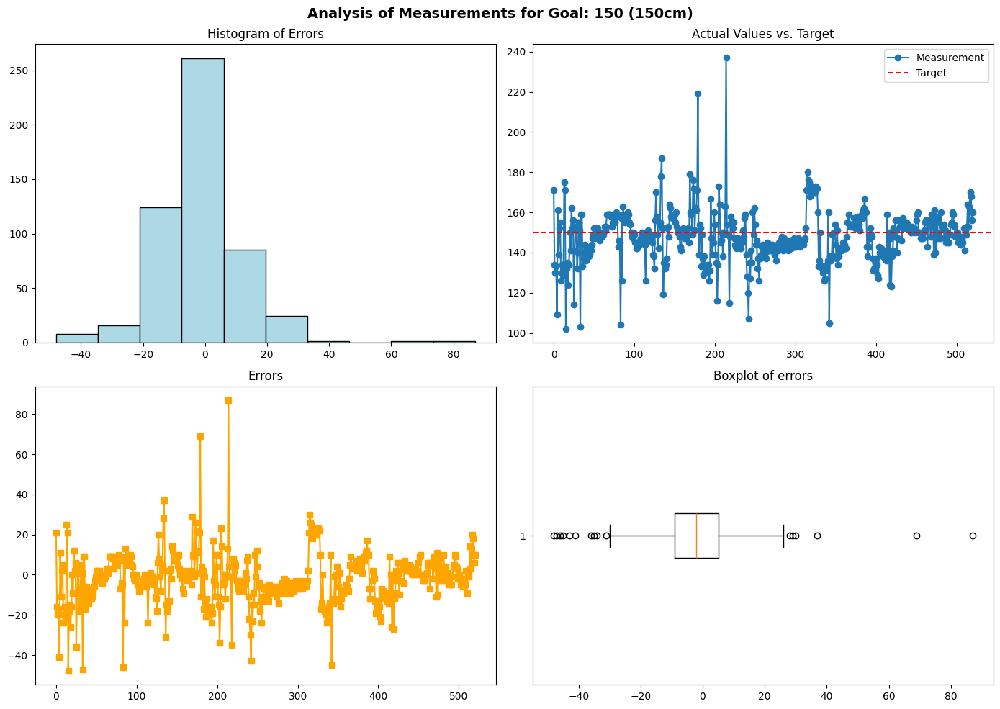

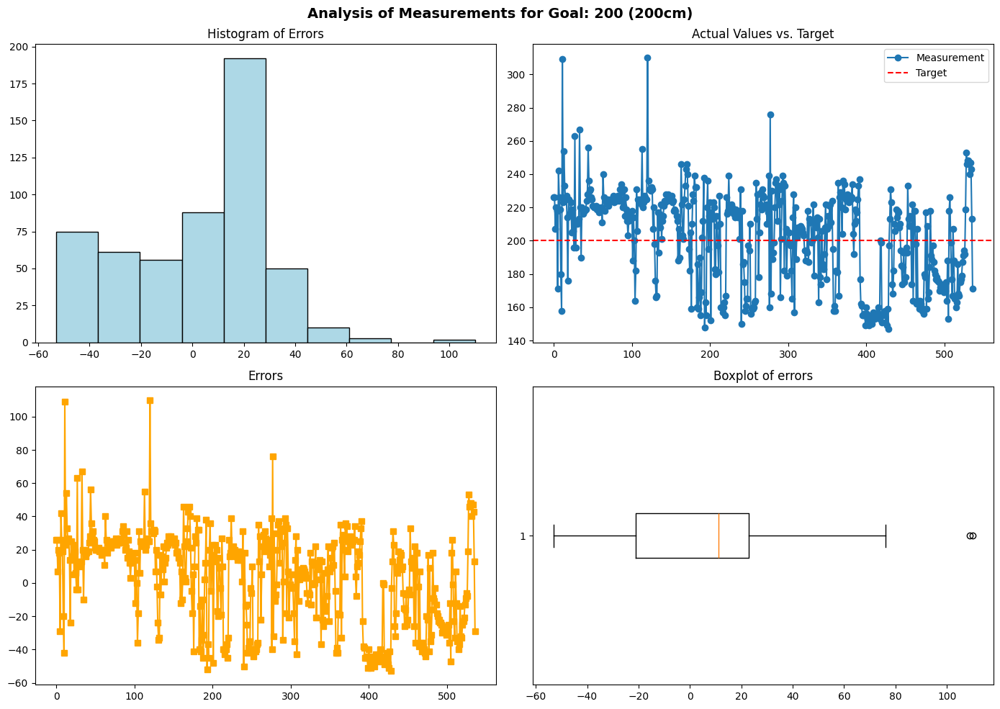

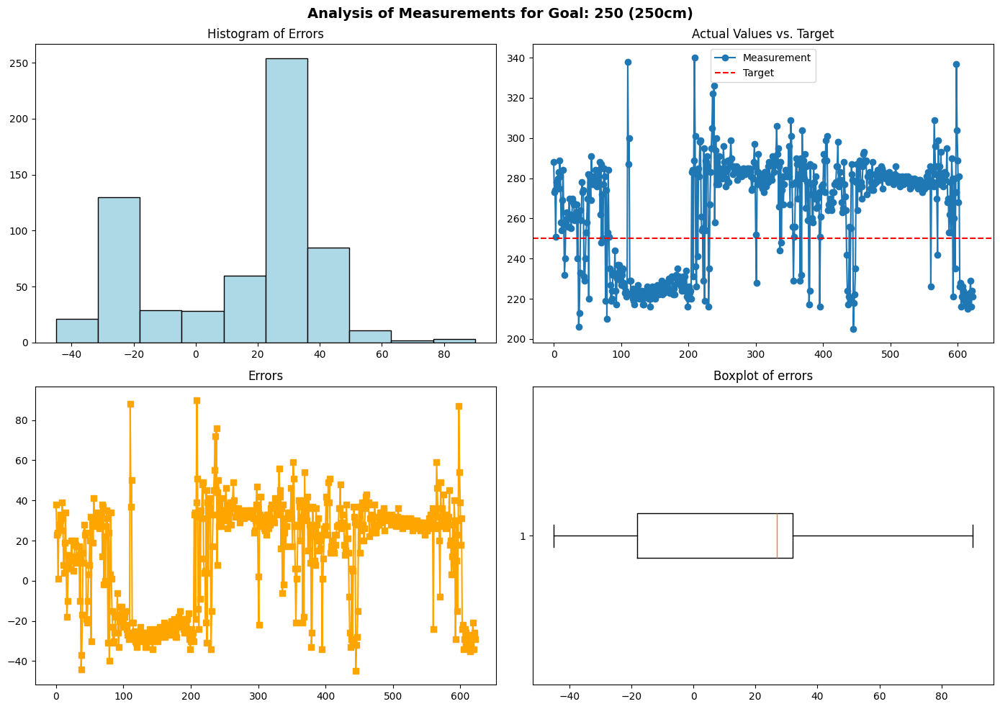

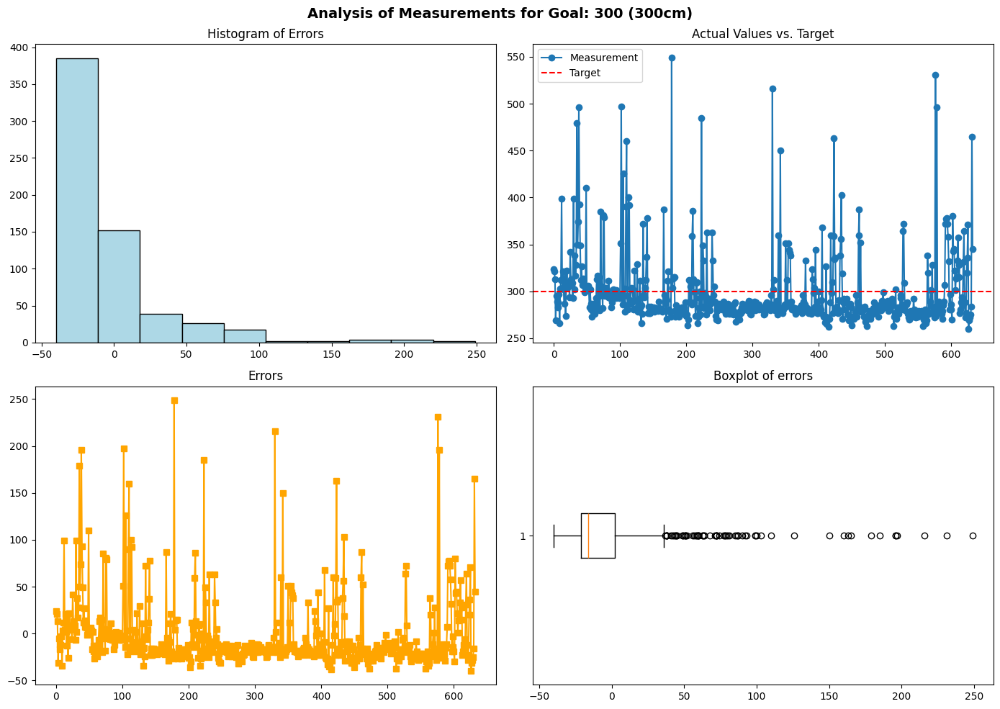

Loading CSV files...
Loaded Putty_Big_100cm_respf_115200.csv as df_Putty_Big_100cm_1
Loaded Putty_Big_100cm_respf_115200_v2.csv as df_Putty_Big_100cm_2
Loaded Putty_Big_100cm_respf_115200_v3.csv as df_Putty_Big_100cm_3
Loaded Putty_Big_150cm_respf_115200.csv as df_Putty_Big_150cm_1
Loaded Putty_Big_150cm_respf_115200_v2.csv as df_Putty_Big_150cm_2
Loaded Putty_Big_150cm_respf_115200_v3.csv as df_Putty_Big_150cm_3
Loaded Putty_Big_200cm_respf_115200.csv as df_Putty_Big_200cm_1
Loaded Putty_Big_200cm_respf_115200_v2.csv as df_Putty_Big_200cm_2
Loaded Putty_Big_200cm_respf_115200_v3.csv as df_Putty_Big_200cm_3
Loaded Putty_Big_250cm_respf_115200.csv as df_Putty_Big_250cm_1
Loaded Putty_Big_250cm_respf_115200_v2.csv as df_Putty_Big_250cm_2
Loaded Putty_Big_250cm_respf_115200_v3.csv as df_Putty_Big_250cm_3
Loaded Putty_Big_300cm_respf_115200.csv as df_Putty_Big_300cm_1
Loaded Putty_Big_300cm_respf_115200_v2.csv as df_Putty_Big_300cm_2
Loaded Putty_Big_300cm_respf_115200_v3.csv as df_Putty_B

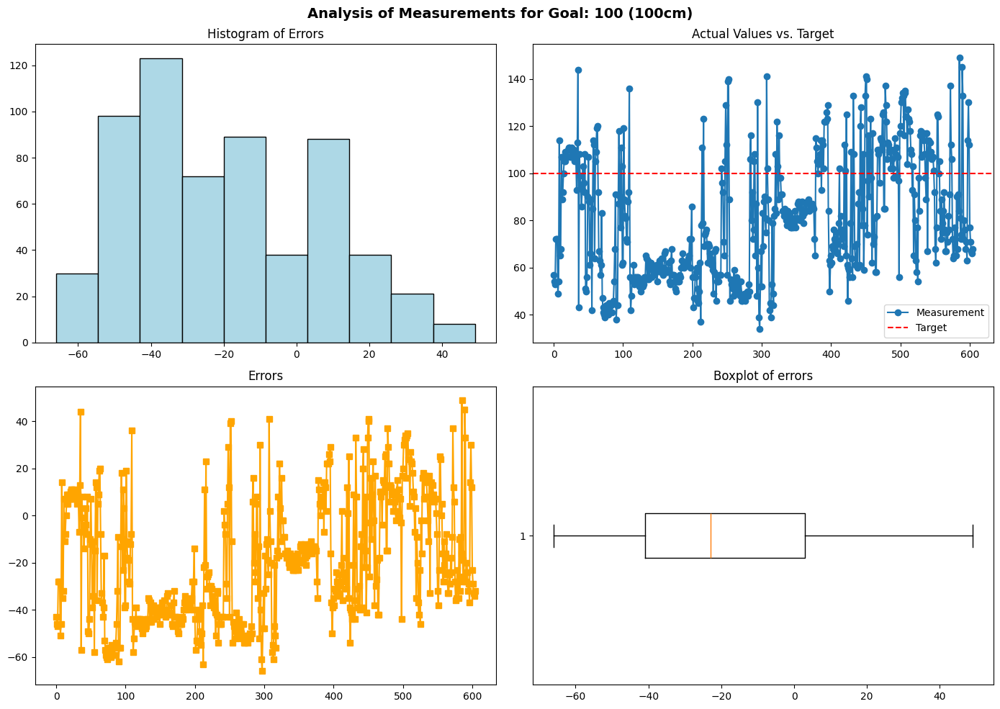

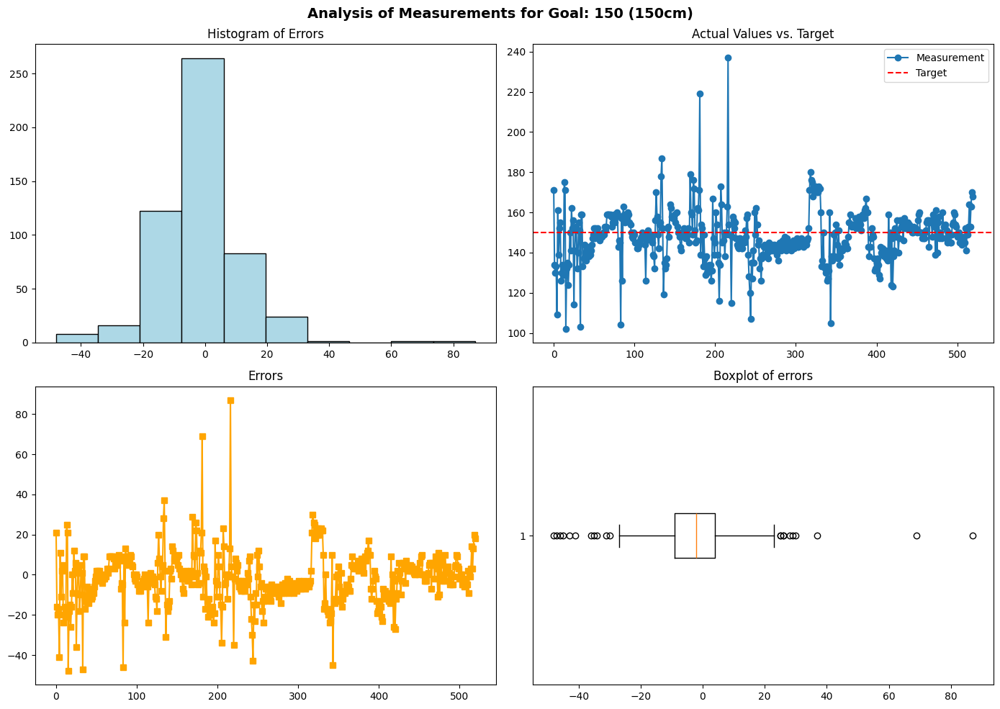

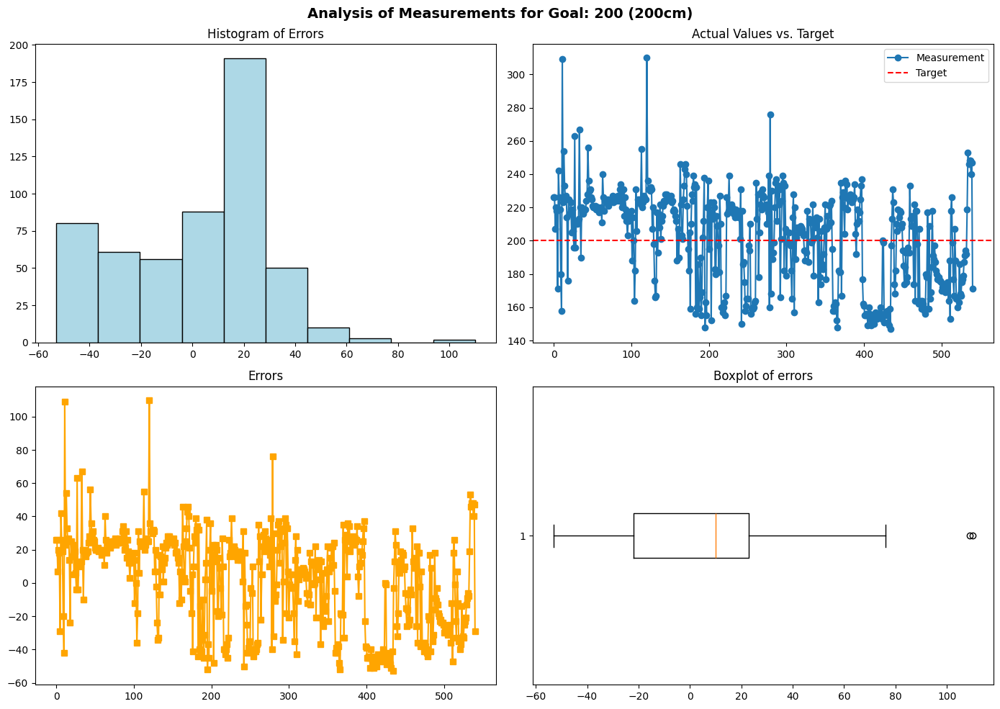

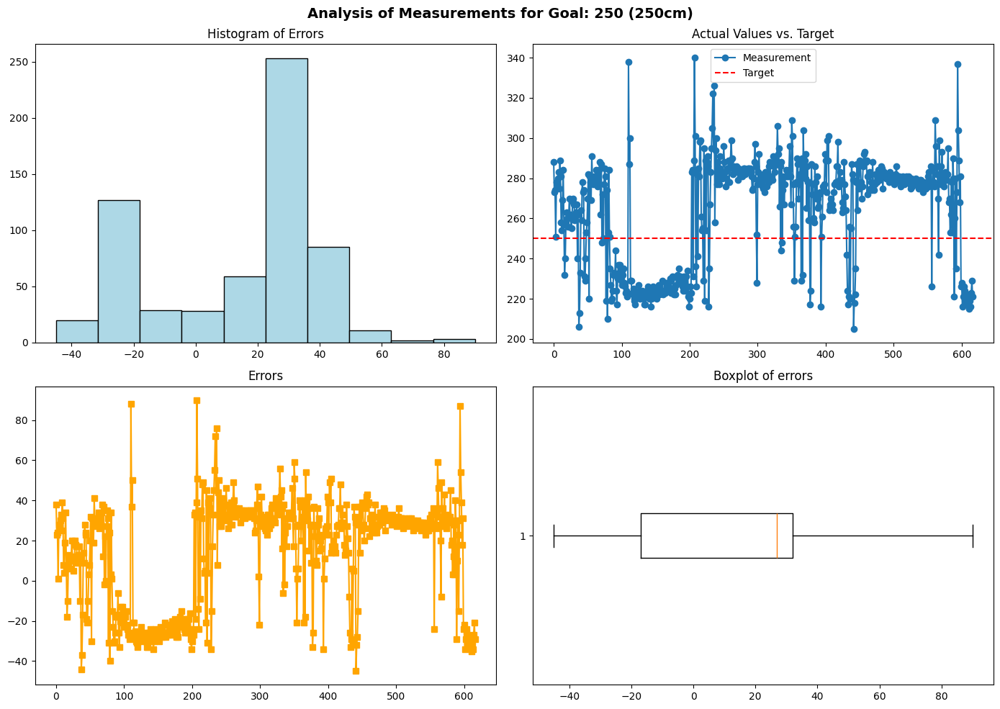

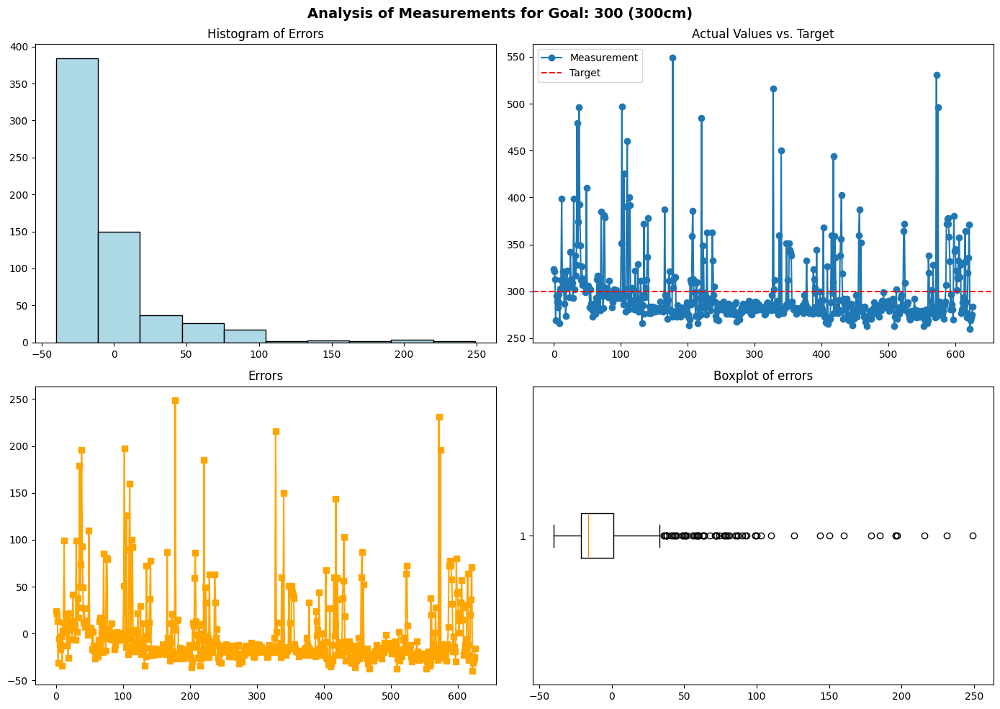


### Comparison for 100cm ###
+-----------+-----------+-----------+
| Metrics   |     INITF |     RESPF |
+===========+===========+===========+
| RMSE      |   32.2943 |   32.3873 |
+-----------+-----------+-----------+
| Max Error |   66      |   66      |
+-----------+-----------+-----------+
| MAE       |   27.8641 |   28.0099 |
+-----------+-----------+-----------+
| Std Error |   25.8348 |   25.7455 |
+-----------+-----------+-----------+
| MSE       | 1042.92   | 1048.94   |
+-----------+-----------+-----------+
| MAPE      |   27.8641 |   28.0099 |
+-----------+-----------+-----------+

### Comparison for 150cm ###
+-----------+-----------+-----------+
| Metrics   |     INITF |     RESPF |
+===========+===========+===========+
| RMSE      |  12.8481  |  12.8214  |
+-----------+-----------+-----------+
| Max Error |  87       |  87       |
+-----------+-----------+-----------+
| MAE       |   9.07486 |   9.03077 |
+-----------+-----------+-----------+
| Std Error |  12.6767  |  1

In [3]:
def main():
    substrings = ['Putty_Big_100cm', 'Putty_Big_150cm', 'Putty_Big_200cm', 'Putty_Big_250cm', 'Putty_Big_300cm']
    specific_value = 'SUCCESS'
    distance_column = 'distance[cm]'
    status_column = 'status'
    targets = {'100cm': 100, '150cm': 150, '200cm': 200, '250cm': 250, '300cm': 300}

    os.chdir(r"C:\Users\janmi\PycharmProjects\Studies")

    # Analysis for initf
    orchestrator1 = Orchestrator("venv/logs_reader/output/initf", substrings, specific_value, distance_column, status_column)
    orchestrator1.run_analysis(targets)

    os.chdir(r"C:\Users\janmi\PycharmProjects\Studies")
    
    # Analysis for respf
    orchestrator2 = Orchestrator("venv/logs_reader/output/respf", substrings, specific_value, distance_column, status_column)
    orchestrator2.run_analysis(targets)

    # Outputs comparison
    for substring in targets.keys():
        print(f"\n### Comparison for {substring} ###")
        Orchestrator.compare_metrics(orchestrator1.results.get(substring, {}), orchestrator2.results.get(substring, {}))
    print("\nAnalysis finished.")

if __name__ == "__main__":
    main()


### **Measurement Analysis and Interpretation(INITF)**

1. **Histogram of Errors** (distribution of deviations),
2. **Actual Values vs Target** (scatter of measurements compared to target),
3. **Error Time Series** (error behavior over time),
4. **Boxplot of Errors** (error distribution summary).

---

### **1. Target Distance: 100 cm**
- **Histogram**: Errors are predominantly **negative** (underestimations), peaking between -40 cm and 0 cm.
- **Actual Values vs Target**: High variance is observed, with many values significantly below the target.
- **Error Time Series**: Errors fluctuate widely from -60 cm to +40 cm, indicating poor stability in measurements.
- **Boxplot**: Errors are heavily skewed negatively, with a median below zero.

**Interpretation**: At **100 cm**, the measurements systematically underestimate the target. This could suggest a calibration issue at close range.

---

### **2. Target Distance: 150 cm**
- **Histogram**: Errors are centered around **zero** but slightly skewed to the right, indicating mild overestimations.
- **Actual Values vs Target**: Variance reduces compared to 100 cm, with measurements clustering closer to the target.
- **Error Time Series**: Errors are more stable, ranging from -40 to +80 cm, with fewer extreme deviations.
- **Boxplot**: The median error is closer to zero, and outliers are fewer.

**Interpretation**: The accuracy improves at **150 cm**. Most measurements are close to the target, although there is a small tendency to overestimate.

---

### **3. Target Distance: 200 cm**
- **Histogram**: Errors are **slightly positive**, with many values clustered near +20 cm.
- **Actual Values vs Target**: Measurements align well with the target, though occasional spikes occur.
- **Error Time Series**: Errors are stable, with minor oscillations in the range of -40 to +60 cm.
- **Boxplot**: The median error shifts slightly positive, but variability remains controlled.

**Interpretation**: At **200 cm**, accuracy and precision are at their best. Minor overestimation emerges but is within acceptable limits.

---

### **4. Target Distance: 250 cm**
- **Histogram**: Errors show a clear positive skew, peaking around +20 cm to +40 cm.
- **Actual Values vs Target**: A consistent **overestimation** is visible, with most measurements above the target line.
- **Error Time Series**: Errors range between -40 cm and +80 cm, showing a persistent positive trend.
- **Boxplot**: The median error shifts upward, and the spread increases.

**Interpretation**: At **250 cm**, a systematic overestimation bias becomes evident. Precision remains acceptable, but calibration adjustments are needed.

---

### **5. Target Distance: 300 cm**
- **Histogram**: Errors are heavily skewed **positively**, with a long tail extending up to +200 cm.
- **Actual Values vs Target**: Significant variability is observed, with many measurements far above the target.
- **Error Time Series**: Errors are erratic, ranging widely from 0 to +250 cm, indicating instability at this distance.
- **Boxplot**: The error spread is very large, and numerous extreme outliers are present.

**Interpretation**: At **300 cm**, measurement accuracy degrades significantly. There is a strong overestimation bias, and precision is poor, likely due to system limitations at greater distances.

---

### **Summary of Trends**
1. **Accuracy**:
   - Measurements underestimate the target at **100 cm**.
   - Accuracy improves at **150 cm** and **200 cm**.
   - Overestimation occurs at **250 cm** and worsens at **300 cm**.
   
2. **Precision**:
   - Precision is highest at **200 cm**.
   - Measurements become less stable at greater distances, with large error spreads at **300 cm**.

3. **Systematic Bias**:
   - **Negative bias** (underestimation) at short distances.
   - **Positive bias** (overestimation) at long distances.

---




### **Measurement Analysis and Interpretation(RESPF)**
1. **Histogram of Errors** (distribution of deviations),
2. **Actual Values vs Target** (scatter of measurements compared to target),
3. **Error Time Series** (error behavior over time),
4. **Boxplot of Errors** (error distribution summary).

---

### 1. **100 cm Target**
- **Histogram of Errors**: Errors show a **negative bias**, with many measurements significantly underestimating the target.
- **Actual Values vs Target**: Measurements fluctuate heavily around the target line (100 cm). The spread and inconsistencies are wide, with both overestimations and underestimations.
- **Error Plot**: Errors oscillate between -60 cm and 40 cm, highlighting significant variability.
- **Boxplot**: The median error is **negative**, with a large interquartile range and outliers indicating significant spread.

**Interpretation**: The system consistently underestimates the target, and precision is poor with large variability.

---

### 2. **150 cm Target**
- **Histogram of Errors**: Errors are more centered around zero but slightly skewed positively.
- **Actual Values vs Target**: Measurements are closer to the target, and the spread is reduced compared to the 100 cm target.
- **Error Plot**: Errors range from -40 to +80, showing improvement but still significant variability.
- **Boxplot**: Errors are more concentrated around the median, with fewer extreme outliers.

**Interpretation**: The accuracy improves significantly compared to 100 cm. Precision is moderate, but there is a slight positive bias (overestimation).

---

### 3. **200 cm Target**
- **Histogram of Errors**: Errors cluster closely around **positive values**.
- **Actual Values vs Target**: Measurements cluster closer to the target line with occasional large outliers.
- **Error Plot**: Errors show fewer oscillations, ranging between -40 and +80 cm.
- **Boxplot**: The interquartile range is tighter, and the spread is smaller compared to lower targets.

**Interpretation**: At this distance, the measurements are generally accurate and consistent. A small positive bias emerges, but performance is better compared to 100 cm and 150 cm.

---

### 4. **250 cm Target**
- **Histogram of Errors**: Errors shift towards positive values, indicating consistent overestimation.
- **Actual Values vs Target**: Measurements fluctuate less but remain consistently above the target.
- **Error Plot**: Errors range from -40 to +80 cm, with a trend toward positive values.
- **Boxplot**: A noticeable positive skew, with fewer extreme negative errors.

**Interpretation**: The measurements show a systematic overestimation bias. Precision remains stable, but the accuracy starts to degrade slightly at higher target values.

---

### 5. **300 cm Target**
- **Histogram of Errors**: Errors have a strong positive skew with extreme outliers up to **+200 cm**.
- **Actual Values vs Target**: Measurements show significant deviations above the target, with many extreme values.
- **Error Plot**: Errors increase dramatically, ranging from 0 to +250 cm, indicating very poor precision.
- **Boxplot**: A large spread with extreme positive outliers dominates the distribution.

**Interpretation**: At 300 cm, measurements are highly inaccurate and imprecise. There is a systematic overestimation bias, and variability increases significantly. This could indicate limitations of the measurement system at long distances.

---

### 6. **Overall Trends**
1. **Accuracy**: Accuracy decreases as the target distance increases:
   - **Underestimation** at lower targets (100 cm).
   - **Overestimation** at higher targets (200 cm and above).
2. **Precision**: Precision is best at mid-range distances (150 cm to 200 cm). Variability increases significantly at 300 cm.
3. **Bias**:
   - Negative bias (underestimation) for small distances.
   - Positive bias (overestimation) for large distances.
4. **Outliers**: Outliers become more prominent at longer distances, particularly at **300 cm**, indicating potential measurement system limitations.

---


### **Interpretation of Measurement Metrics**

The provided comparison tables for target distances (100 cm, 150 cm, 200 cm, 250 cm, and 300 cm) include the following metrics:
- **MAPE**: Mean Absolute Percentage Error
- **MSE**: Mean Squared Error
- **Std Error**: Standard Error
- **MAE**: Mean Absolute Error
- **Max Error**: Maximum observed error
- **RMSE**: Root Mean Squared Error

Each target distance compares **Wynik 1** and **Wynik 2**, showing slight differences in performance.

---

### **1. Target: 100 cm**
| Metric          | Wynik 1       | Wynik 2       | Observations                                |
|-----------------|---------------|---------------|--------------------------------------------|
| **MAPE**        | 27.8641       | 28.0099       | High error percentage, significant bias.   |
| **MSE**         | 1042.92       | 1048.94       | Large squared deviations.                  |
| **Std Error**   | 25.8348       | 25.7455       | Errors fluctuate around ±25.8.             |
| **MAE**         | 27.8641       | 28.0099       | High mean absolute deviation.              |
| **Max Error**   | 66            | 66            | Large error (66 cm), underlines instability.|
| **RMSE**        | 32.2943       | 32.3873       | High RMSE confirms large overall errors.   |

**Interpretation**:  
At 100 cm, there is a **systematic underestimation** issue. High MAPE and RMSE indicate significant inaccuracies, likely due to calibration issues at short distances.

---

### **2. Target: 150 cm**
| Metric          | Wynik 1       | Wynik 2       | Observations                                |
|-----------------|---------------|---------------|--------------------------------------------|
| **MAPE**        | 6.0499        | 6.02051       | Low error percentage; improved accuracy.   |
| **MSE**         | 165.075       | 164.388       | Reduced squared deviations.                |
| **Std Error**   | 12.6767       | 12.6489       | Relatively stable errors.                  |
| **MAE**         | 9.07486       | 9.03077       | Much smaller deviations compared to 100 cm.|
| **Max Error**   | 87            | 87            | Few larger errors persist.                 |
| **RMSE**        | 12.8481       | 12.8214       | Low RMSE, good overall performance.        |

**Interpretation**:  
At 150 cm, **accuracy improves significantly** with much lower MAPE and RMSE. Measurements are stable, though some larger errors persist.

---

### **3. Target: 200 cm**
| Metric          | Wynik 1       | Wynik 2       | Observations                                |
|-----------------|---------------|---------------|--------------------------------------------|
| **MAPE**        | 12.0205       | 12.1137       | Moderate error percentage.                 |
| **MSE**         | 779.33        | 790.009       | Squared errors remain moderate.            |
| **Std Error**   | 27.7859       | 28.0184       | Errors fluctuate ±27.8.                    |
| **MAE**         | 24.041        | 24.2274       | Average deviations remain moderate.        |
| **Max Error**   | 110           | 110           | Large errors observed occasionally.        |
| **RMSE**        | 27.9165       | 28.1071       | Moderate overall errors.                   |

**Interpretation**:  
At 200 cm, errors increase slightly, and **a positive bias emerges**. While accuracy is acceptable, large deviations (Max Error: 110) persist.

---

### **4. Target: 250 cm**
| Metric          | Wynik 1       | Wynik 2       | Observations                                |
|-----------------|---------------|---------------|--------------------------------------------|
| **MAPE**        | 11.1852       | 11.1922       | Moderate error percentage.                 |
| **MSE**         | 901.398       | 903.258       | Squared errors increase slightly.          |
| **Std Error**   | 26.7433       | 26.647        | Stable but high error spread.              |
| **MAE**         | 27.9631       | 27.9806       | Larger mean errors compared to 200 cm.     |
| **Max Error**   | 90            | 90            | Consistent maximum error.                  |
| **RMSE**        | 30.0233       | 30.0542       | Higher RMSE confirms growing inaccuracies. |

**Interpretation**:  
At 250 cm, the measurements show **increased overestimation**. Both accuracy (MAPE) and overall errors (RMSE) degrade slightly compared to 200 cm.

---

### **5. Target: 300 cm**
| Metric          | Wynik 1       | Wynik 2       | Observations                                |
|-----------------|---------------|---------------|--------------------------------------------|
| **MAPE**        | 8.37388       | 8.28549       | Moderate percentage error; improves slightly.|
| **MSE**         | 1474.39       | 1428.17       | Significant squared deviations.            |
| **Std Error**   | 38.3488       | 37.7206       | Large errors with substantial spread.      |
| **MAE**         | 25.1216       | 24.8565       | Moderate mean error; stable performance.   |
| **Max Error**   | 249           | 249           | Extremely large deviations.                |
| **RMSE**        | 38.3979       | 37.7911       | High RMSE confirms poor accuracy.          |

**Interpretation**:  
At 300 cm, the measurement system exhibits **significant overestimation** and instability. While MAPE improves slightly, the presence of very large errors (Max Error: 249) and high RMSE highlights system limitations at this distance.

---

### **Overall Summary and Trends**
1. **Accuracy**:
   - Accuracy is poor at **100 cm** (high underestimation).
   - Best performance is observed at **150 cm**, with low MAPE and RMSE.
   - Accuracy degrades gradually at longer distances, with increasing positive bias.

2. **Errors**:
   - Errors are largest at **100 cm** and **300 cm**.
   - Stability improves between **150 cm** and **200 cm**, but larger errors reappear at **250 cm** and **300 cm**.

3. **Systematic Bias**:
   - **Underestimation** occurs at shorter distances (100 cm).
   - **Overestimation** dominates at longer distances (250 cm and 300 cm).

4. **Performance Across Wynik 1 and Wynik 2**:
   - Differences between **Wynik 1** and **Wynik 2** are minimal, indicating consistent performance across trials.

---


In [4]:
# Set working directory
os.chdir(r"C:\Users\janmi\PycharmProjects\Studies")

# Specify the directory containing the CSV files
directory = os.path.join(os.getcwd(), "venv/logs_reader/output/pomiary_uczelnia")

# Defining substrings for file search
substrings = [
    'Putty_Big_Boards_115200_flat', 'Putty_Big_Boards_115200_v3', 'Putty_big_boards__115200v3',
    'Putty_big_boards_only_115200', 'Putty_big_boards_v2_115200', 'Putty_Big_boards_v3_9600',
    'Putty_big_small_boards_9600', 'Putty_small_boards_9600', 'Putty_small_boards_9600_v2',
    'Putty_small_boards_115200'
]

# Initialize the dictionary for storing DataFrames
dataframes = {}

# Searching and loading CSV files
for substring in substrings:
    count = 1  # Counter for each substring
    for file in os.listdir(directory):  # Browse files in directory
    # Match files containing substring and ending with '.csv'
        if re.search(rf"{substring}(?!\d)", file) and file.endswith(".csv"):
            var_name = f"df_{substring}_{count}"  
            file_path = os.path.join(directory, file)
            
            # Loading a file into a DataFrame and saving it in a dictionary
            dataframes[var_name] = pd.read_csv(file_path)
            print(f"Loaded {file} into {var_name}")
            count += 1

# Summarization
print(f"\nTotal DataFrames Loaded: {len(dataframes)}")
print(f"Available DataFrames: {list(dataframes.keys())}")


Loaded Putty_Big_Boards_115200_flat.csv into df_Putty_Big_Boards_115200_flat_1
Loaded Putty_Big_Boards_115200_v3.csv into df_Putty_Big_Boards_115200_v3_1
Loaded Putty_big_boards_only_115200.csv into df_Putty_big_boards_only_115200_1
Loaded Putty_big_boards_v2_115200.csv into df_Putty_big_boards_v2_115200_1
Loaded Putty_Big_boards_v3_9600.csv into df_Putty_Big_boards_v3_9600_1
Loaded Putty_big_small_boards_9600.csv into df_Putty_big_small_boards_9600_1
Loaded Putty_small_boards_9600.csv into df_Putty_small_boards_9600_1
Loaded Putty_small_boards_9600_v2.csv into df_Putty_small_boards_9600_2
Loaded Putty_small_boards_9600_v2.csv into df_Putty_small_boards_9600_v2_1
Loaded Putty_small_boards_115200.csv into df_Putty_small_boards_115200_1

Total DataFrames Loaded: 10
Available DataFrames: ['df_Putty_Big_Boards_115200_flat_1', 'df_Putty_Big_Boards_115200_v3_1', 'df_Putty_big_boards_only_115200_1', 'df_Putty_big_boards_v2_115200_1', 'df_Putty_Big_boards_v3_9600_1', 'df_Putty_big_small_boards

In [5]:
import pandas as pd

def analyze_dataframes(dataframes, distance_column, status_column, specific_value):
    """
    Analyze multiple DataFrames:
        1. Extract max distance for 'specific_value'.
        2. Calculate percentage of unique values in status column.
        3. Show percentage breakdown of all status values.

    Args:
        dataframes (dict): Dictionary containing all DataFrames.
        distance_column (str): Column to calculate max distance.
        status_column (str): Column to analyze status values.
        specific_value (str): Target value for max distance extraction.

    Returns:
        None: Prints analysis results for each DataFrame.
    """
    # Iterate over each DataFrame in the dictionary
    for name, df in dataframes.items():
        print(f"Analyzing: {name}")
        
        # 1. Max value in distance column for the specific value
        success_distances = df[distance_column][df[status_column] == specific_value]
        if not success_distances.empty:
            max_value = success_distances.max()
            print(f"  Max '{distance_column}' for '{specific_value}': {max_value}")
        else:
            print(f"  No '{specific_value}' values found.")
        
        # 2. Unique values in the status column
        unique_status_counts = df[status_column].value_counts(normalize=True) * 100  # Percentages
        print("  Status Percentage Breakdown:")
        print(unique_status_counts.to_string(index=True, header=False))
        
        print("-" * 50)

# Usage
specific_value = 'SUCCESS'
distance_column = 'distance[cm]'
status_column = 'status'

analyze_dataframes(dataframes, distance_column, status_column, specific_value)


Analyzing: df_Putty_Big_Boards_115200_flat_1
  Max 'distance[cm]' for 'SUCCESS': 404.0
  Status Percentage Breakdown:
RX_TIMEOUT           59.618008
SUCCESS              39.017735
RX_PHY_DEC_FAILED     0.954980
Unknown               0.409277
--------------------------------------------------
Analyzing: df_Putty_Big_Boards_115200_v3_1
  Max 'distance[cm]' for 'SUCCESS': 3523.0
  Status Percentage Breakdown:
RX_TIMEOUT           63.589212
SUCCESS              35.788382
RX_PHY_DEC_FAILED     0.622407
--------------------------------------------------
Analyzing: df_Putty_big_boards_only_115200_1
  Max 'distance[cm]' for 'SUCCESS': 2063.0
  Status Percentage Breakdown:
SUCCESS              52.659020
RX_TIMEOUT           46.506778
RX_PHY_DEC_FAILED     0.834202
--------------------------------------------------
Analyzing: df_Putty_big_boards_v2_115200_1
  Max 'distance[cm]' for 'SUCCESS': 1568.0
  Status Percentage Breakdown:
RX_TIMEOUT           59.765625
SUCCESS              39.648438
RX_P

In [6]:
# Set working directory
os.chdir(r"C:\Users\janmi\PycharmProjects\Studies")

# Specify the directory containing the CSV files
directory = os.path.join(os.getcwd(), "venv/logs_reader/output/nowe_pomiary")

# Initialize the dictionary for storing DataFrames
dataframes = {}

# Searching and loading ALL CSV files
count = 1  # Counter for naming DataFrames
for file in os.listdir(directory):
    if file.endswith(".csv"):  # Process only CSV files
        var_name = f"df_{count}"  # Assign a unique name
        file_path = os.path.join(directory, file)
        
        try:
            # Load CSV into DataFrame and store it in the dictionary
            dataframes[var_name] = pd.read_csv(file_path)
            print(f"Loaded {file} into {var_name}")
            count += 1
        except Exception as e:
            print(f"Failed to load {file}: {e}")

# Summarization
print(f"\nTotal DataFrames Loaded: {len(dataframes)}")
print(f"Available DataFrames: {list(dataframes.keys())}")

# Function to Analyze DataFrames
def analyze_dataframes(dataframes, distance_column, status_column, specific_value):
    """
    Analyze multiple DataFrames:
        1. Extract max distance for 'specific_value'.
        2. Calculate percentage of unique values in status column.
        3. Show percentage breakdown of all status values.

    Args:
        dataframes (dict): Dictionary containing all DataFrames.
        distance_column (str): Column to calculate max distance.
        status_column (str): Column to analyze status values.
        specific_value (str): Target value for max distance extraction.

    Returns:
        None: Prints analysis results for each DataFrame.
    """
    # Iterate over each DataFrame in the dictionary
    for name, df in dataframes.items():
        print(f"Analyzing: {name}")
        
        # 1. Max value in distance column for the specific value
        if distance_column in df.columns and status_column in df.columns:
            success_distances = df[distance_column][df[status_column] == specific_value]
            if not success_distances.empty:
                max_value = success_distances.max()
                print(f"  Max '{distance_column}' for '{specific_value}': {max_value}")
            else:
                print(f"  No '{specific_value}' values found.")
            
            # 2. Unique values in the status column
            unique_status_counts = df[status_column].value_counts(normalize=True) * 100  # Percentages
            print("  Status Percentage Breakdown:")
            print(unique_status_counts.to_string(index=True, header=False))
        else:
            print(f"  Columns '{distance_column}' or '{status_column}' not found in the DataFrame.")

        print("-" * 50)

# Analyze all DataFrames
specific_value = 'Ok'
distance_column = 'D_cm'
status_column = 'Status'

analyze_dataframes(dataframes, distance_column, status_column, specific_value)


Loaded small_boards_100.csv into df_1
Loaded small_boards_1000_4.csv into df_2
Loaded small_boards_1000_5.csv into df_3
Loaded small_boards_1000_6.csv into df_4
Loaded small_boards_100_2.csv into df_5
Loaded small_boards_100_3.csv into df_6
Loaded small_boards_100_4.csv into df_7
Loaded small_boards_100_5.csv into df_8
Loaded small_boards_1100_4.csv into df_9
Loaded small_boards_1100_5.csv into df_10
Loaded small_boards_1100_6.csv into df_11
Loaded small_boards_1200_4.csv into df_12
Loaded small_boards_1200_5.csv into df_13
Loaded small_boards_1300_4.csv into df_14
Loaded small_boards_150.csv into df_15
Loaded small_boards_150_2.csv into df_16
Loaded small_boards_150_3.csv into df_17
Loaded small_boards_200.csv into df_18
Loaded small_boards_200_2.csv into df_19
Loaded small_boards_200_3.csv into df_20
Loaded small_boards_200_4.csv into df_21
Loaded small_boards_200_5.csv into df_22
Loaded small_boards_250.csv into df_23
Loaded small_boards_250_2.csv into df_24
Loaded small_boards_250_

### **Interpretation of the DataFrame Analysis**

### **1. General Trends**

1. **Maximum `D_cm` for "Ok" Status**:
   - The maximum distance (`D_cm`) where the status is marked as "Ok" ranges from **22.0** to **1382.0 cm**.
   - Shorter ranges (e.g., `df_1`, `df_5`, `df_43`) have lower maximum "Ok" values (≤129 cm), suggesting a possible degradation in the system's ability to maintain valid measurements at close range in some cases.
   - Longer ranges (e.g., `df_2` → 1100 cm, `df_14` → 1382 cm) show that the system sometimes reaches high distances with valid outputs.

2. **Status Percentage Breakdown**:
   - **Balanced Cases**: In several DataFrames (`df_1`, `df_5`, `df_6`, `df_7`, etc.), the breakdown is exactly **50% `Ok` and 50% `Err`**. This indicates equal distribution between errors and valid measurements.
   - **High Error Rates**: Some DataFrames have significant error dominance:
       - `df_2`: **91.88% Err**  
       - `df_3`: **96.98% Err**  
       - `df_14`: **96.66% Err**
       - `df_57`, `df_58`, `df_59`: Over **70% Err**
     This shows that at longer distances or certain conditions, the system frequently fails to provide valid outputs.
   - **Moderate Error Rates**: DataFrames such as `df_10` (54.6% Err) and `df_31` (54.0% Err) have slight error dominance, indicating instability but not catastrophic failure.
   - **Low Error Rates**: A few DataFrames (`df_32`, `df_33`, `df_50`) are close to 50/50 splits, but lean slightly towards valid results.

---

### **2. Observations Across All DataFrames**
- **Short Ranges** (e.g., `D_cm` ≤ 200):
  - The results are generally balanced (50/50 split between "Ok" and "Err").
  - Shorter maximum "Ok" values indicate the system performs inconsistently at close distances.
- **Medium Ranges** (e.g., `200 < D_cm ≤ 600`):
  - Many DataFrames maintain 50/50 splits, suggesting better stability.
  - Some cases (e.g., `df_30`, `df_35`) exhibit increased errors, implying occasional breakdowns.
- **Long Ranges** (e.g., `D_cm > 800`):
  - A significant number of DataFrames display high error rates (70-97%).
  - This suggests the system struggles to maintain valid measurements as distances increase beyond **800 cm**.

---

### **3. Key Findings**
1. **Distance and Errors**:
   - At short distances, errors occur intermittently, which might indicate **system calibration issues** or sensitivity to small variations.
   - At longer distances, errors dominate, highlighting **system limitations** in measuring reliably beyond certain thresholds (e.g., 800 cm).

2. **Consistent 50/50 Splits**:
   - Many DataFrames exhibit an even split of errors and valid results, implying **system instability** where results fluctuate rather than showing a consistent pattern.

3. **Outliers with High Error Rates**:
   - DataFrames like `df_2`, `df_3`, `df_14`, and those beyond 1000 cm (e.g., `df_57`, `df_58`, `df_59`) show extremely high error rates. This suggests:
     - Either the system reaches a **critical failure point** at longer ranges.
     - Or specific conditions (e.g., noise, hardware limitations) degrade performance significantly.

---

### **4. Final Assumption**
Based on the analysis, the following conclusions can be drawn:
1. **System Instability**:
   - The system often fluctuates between valid and error states, particularly at short to medium distances (50/50 splits).
2. **Performance at Long Distances**:
   - Beyond **800 cm**, the error rates significantly increase, indicating a **systematic limitation** in measurement accuracy or signal reliability.
3. **Critical Failure Zones**:
   - Specific DataFrames (`df_2`, `df_3`, `df_14`) highlight severe issues with over **90% errors**, suggesting hardware failure, calibration problems, or environmental interference.
4. **Calibration Needs**:
   - The system requires **calibration improvements** at short distances to reduce intermittent errors.
   - At longer ranges, further **hardware optimization** or signal enhancement is needed to reduce error rates.

---



### Running Analysis for All CSV Files ###
Loading CSV files...
Loaded small_boards_50.csv as df_small_boards_50.csv_1
Loaded small_boards_50_2.csv as df_small_boards_50_2.csv_1
Loaded small_boards_50_3.csv as df_small_boards_50_3.csv_1
Loaded small_boards_100.csv as df_small_boards_100.csv_1
Loaded small_boards_100_2.csv as df_small_boards_100_2.csv_1
Loaded small_boards_100_3.csv as df_small_boards_100_3.csv_1
Loaded small_boards_100_4.csv as df_small_boards_100_4.csv_1
Loaded small_boards_100_5.csv as df_small_boards_100_5.csv_1
Loaded small_boards_150.csv as df_small_boards_150.csv_1
Loaded small_boards_150_2.csv as df_small_boards_150_2.csv_1
Loaded small_boards_150_3.csv as df_small_boards_150_3.csv_1
Loaded small_boards_200.csv as df_small_boards_200.csv_1
Loaded small_boards_200_2.csv as df_small_boards_200_2.csv_1
Loaded small_boards_200_3.csv as df_small_boards_200_3.csv_1
Loaded small_boards_200_4.csv as df_small_boards_200_4.csv_1
Loaded small_boards_200_5.csv as df_small_

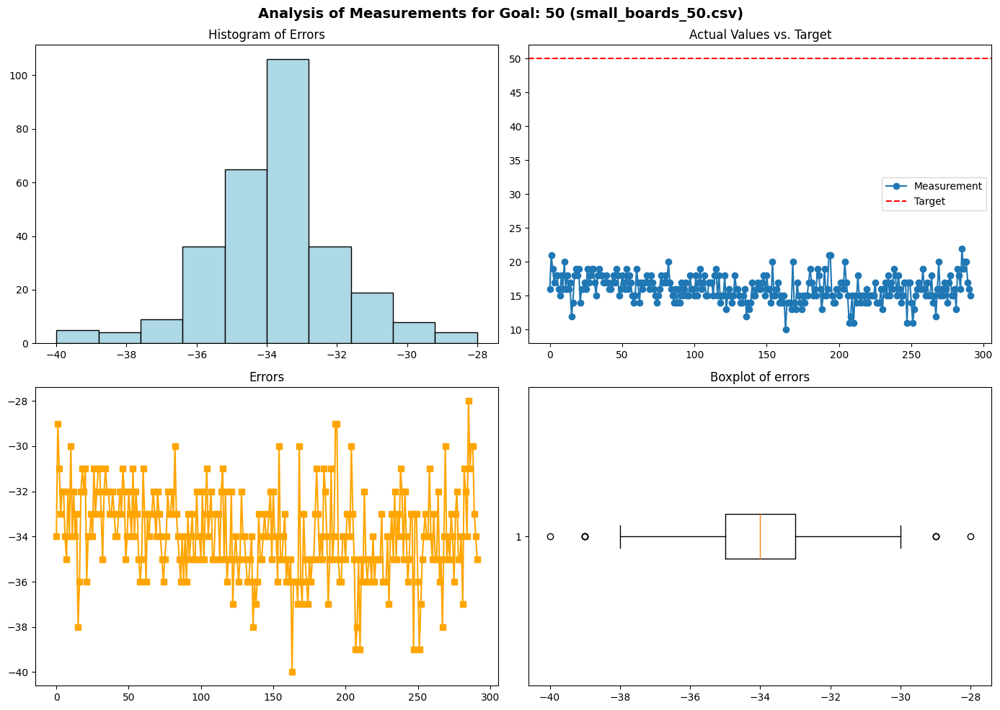

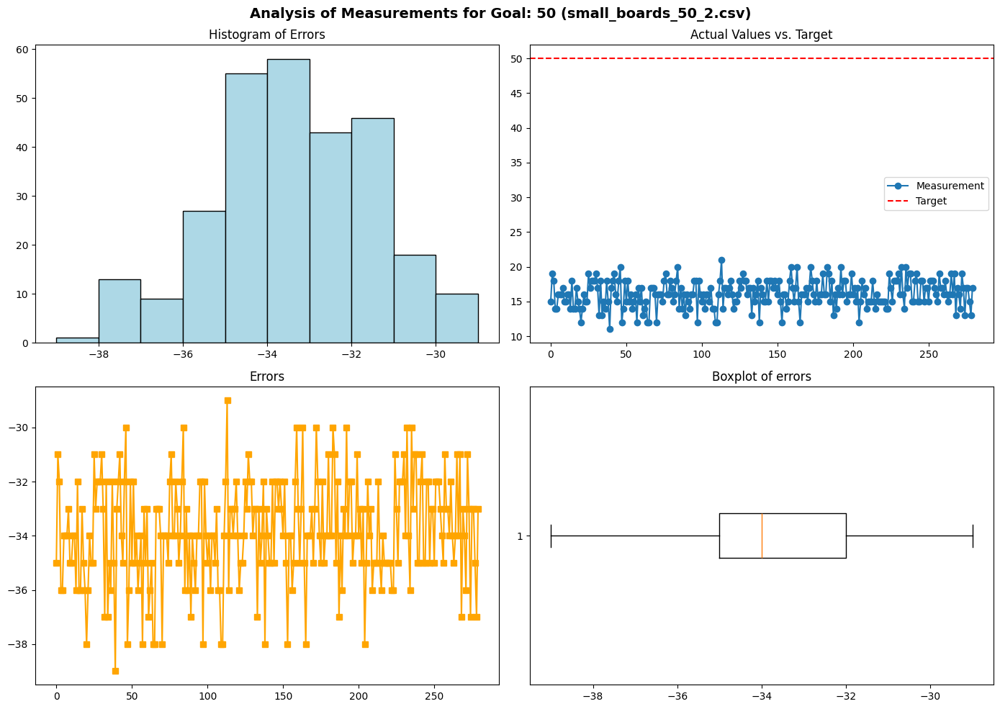

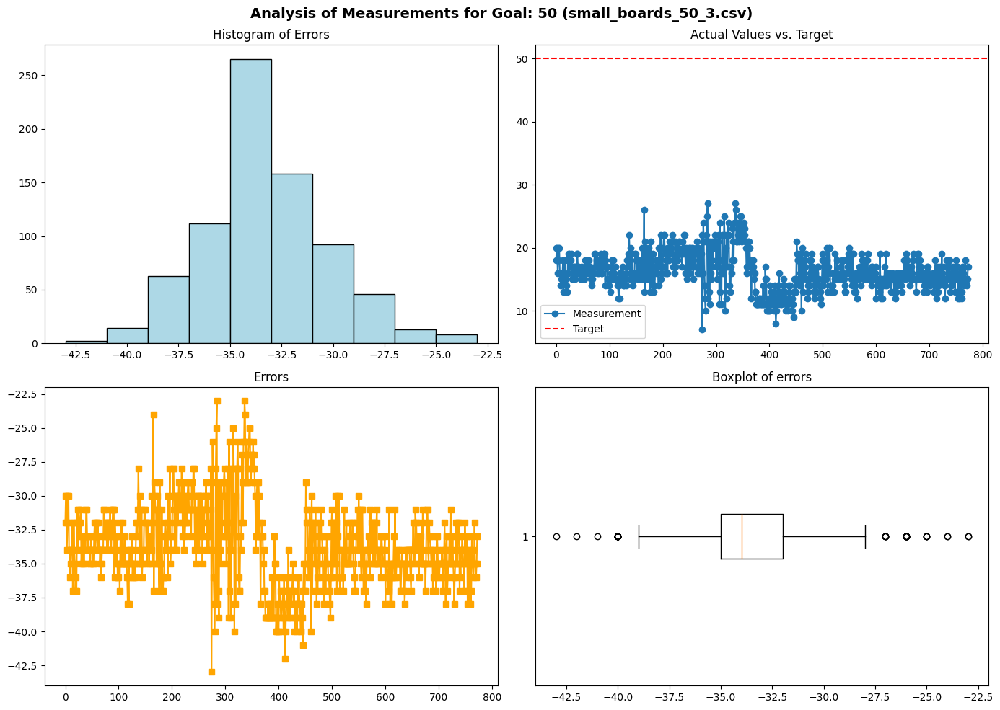

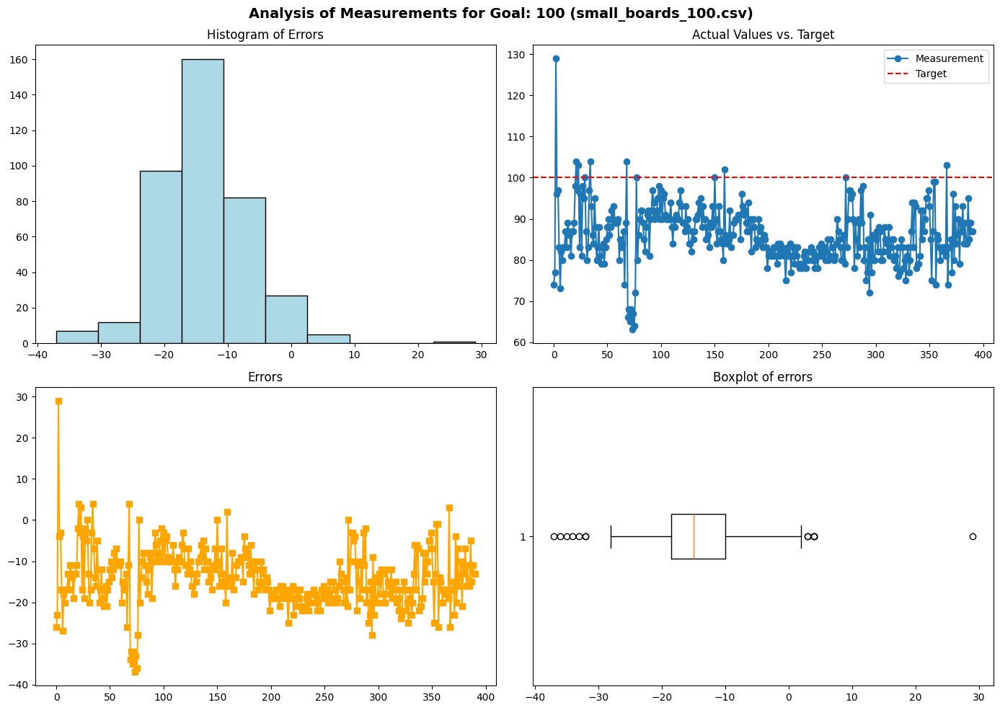

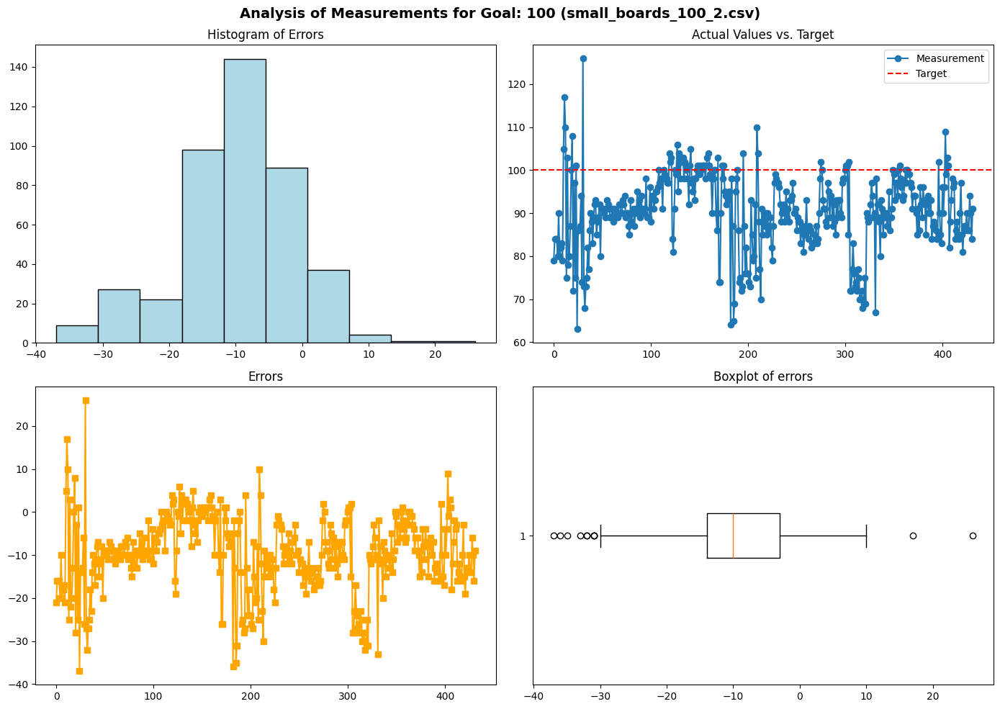

...

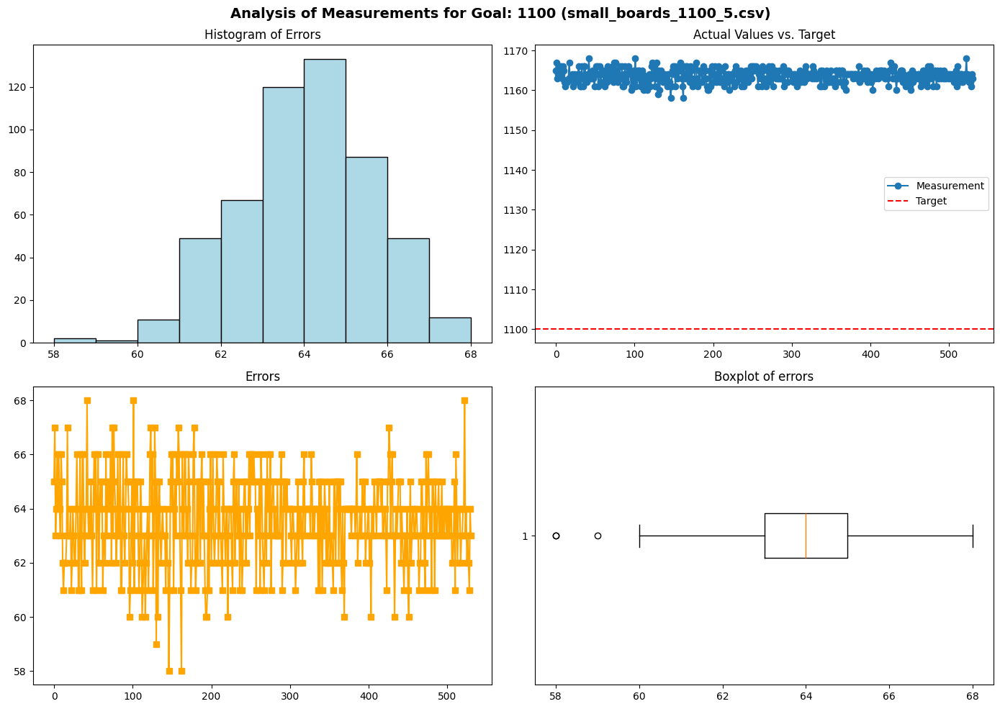

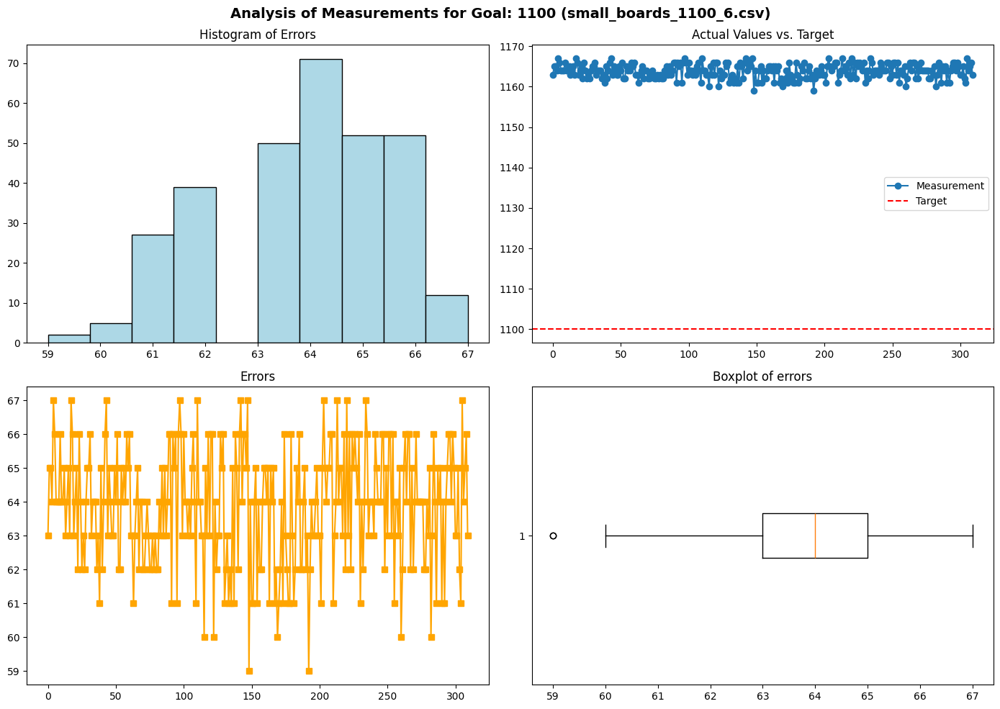

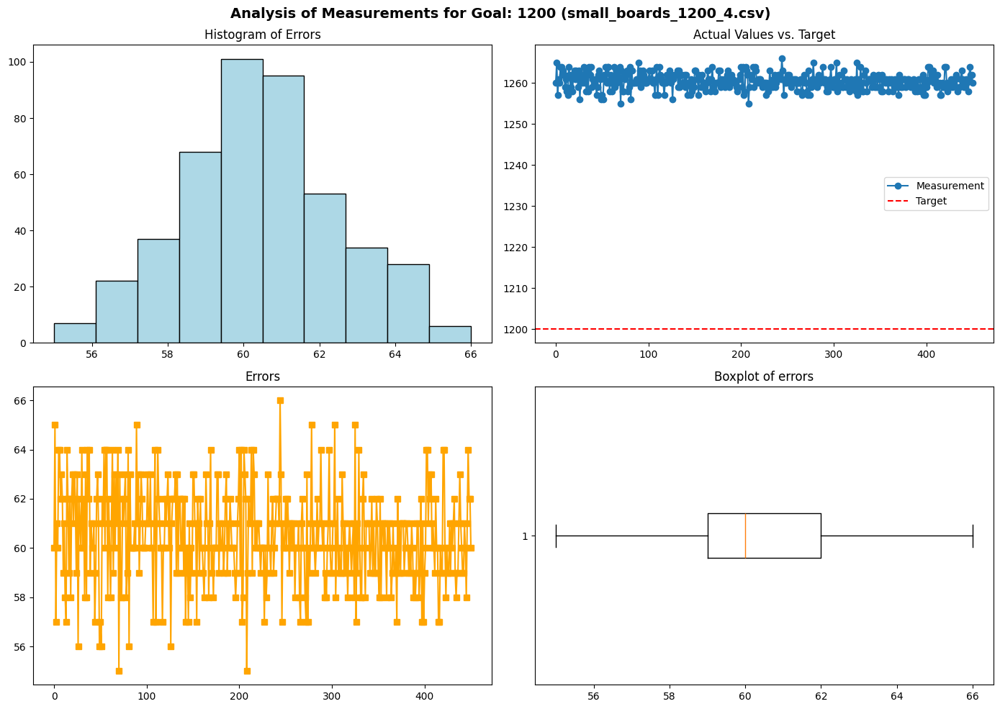

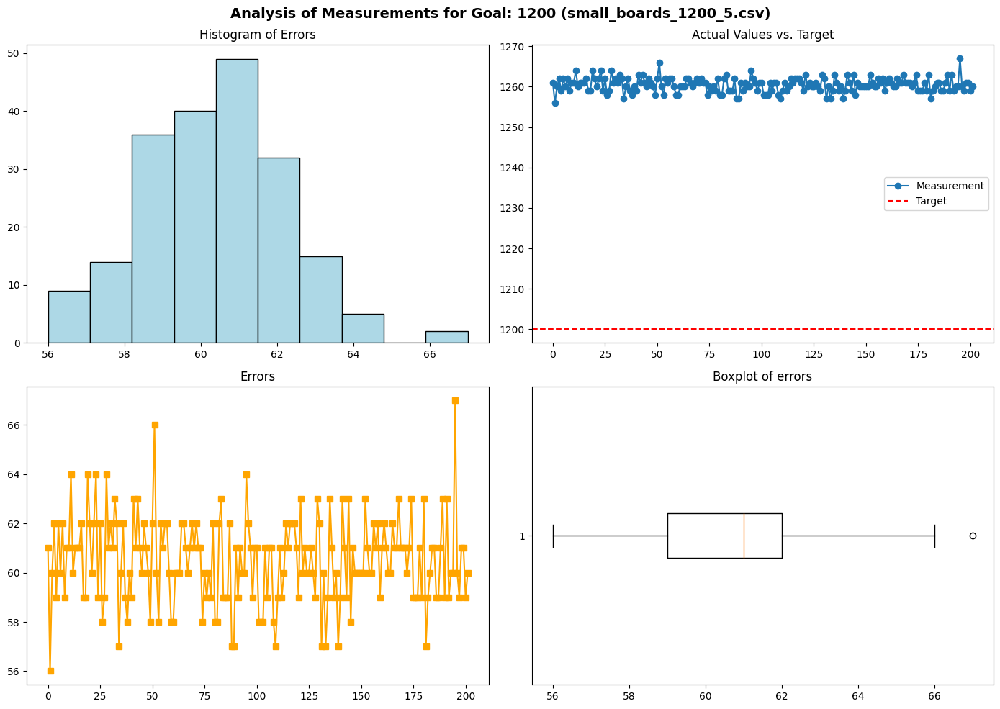

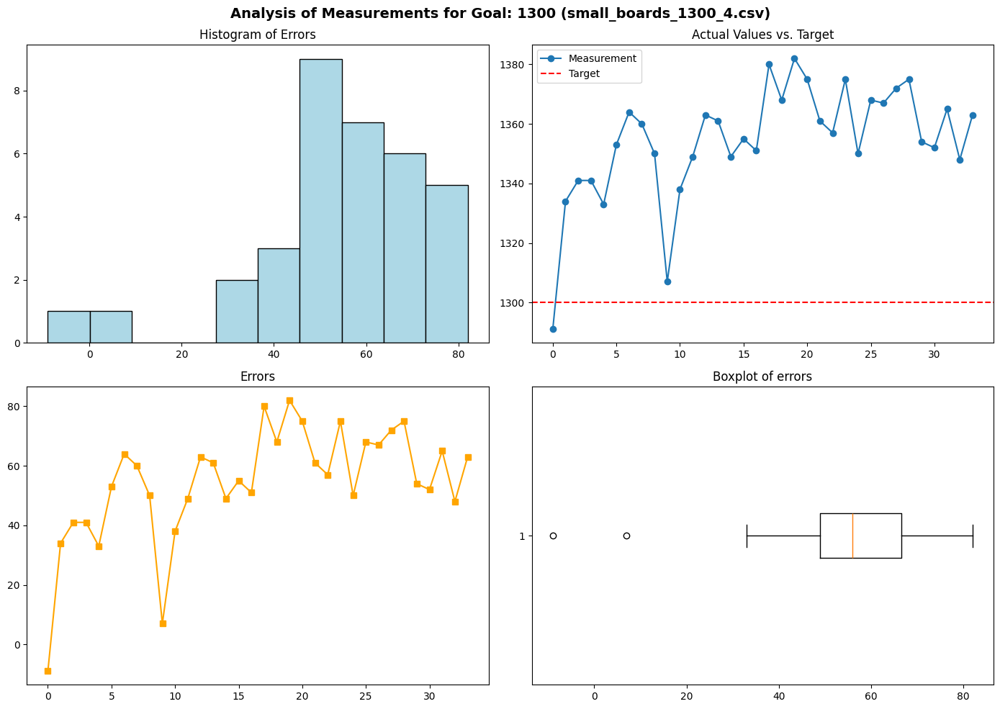


### Metrics for small_boards_50.csv ###
MAE: 33.9075
MSE: 1153.4623
RMSE: 33.9627
MAPE: 67.8151
Max Error: 40.0000
Std Error: 1.9343

### Metrics for small_boards_50_2.csv ###
MAE: 33.8679
MSE: 1150.7107
RMSE: 33.9221
MAPE: 67.7357
Max Error: 39.0000
Std Error: 1.9181

### Metrics for small_boards_50_3.csv ###
MAE: 33.7762
MSE: 1150.0065
RMSE: 33.9117
MAPE: 67.5524
Max Error: 43.0000
Std Error: 3.0290

### Metrics for small_boards_100.csv ###
MAE: 14.3223
MSE: 246.6087
RMSE: 15.7038
MAPE: 14.3223
Max Error: 37.0000
Std Error: 6.9713

### Metrics for small_boards_100_2.csv ###
MAE: 10.5116
MSE: 171.0579
RMSE: 13.0789
MAPE: 10.5116
Max Error: 37.0000
Std Error: 8.7201

### Metrics for small_boards_100_3.csv ###
MAE: 12.2118
MSE: 211.5549
RMSE: 14.5449
MAPE: 12.2118
Max Error: 76.0000
Std Error: 9.5785

### Metrics for small_boards_100_4.csv ###
MAE: 29.2107
MSE: 966.5536
RMSE: 31.0894
MAPE: 29.2107
Max Error: 68.0000
Std Error: 23.9247

### Metrics for small_boards_100_5.csv ###
MAE: 29

In [7]:
def main():
    # Set up directory dynamically
    os.chdir(r'C:\Users\janmi\PycharmProjects\Studies')
    directory = os.path.join(os.getcwd(), "venv/logs_reader/output/nowe_pomiary")
    specific_value = 'Ok'
    distance_column = 'D_cm'
    status_column = 'Status'

    # Extract and sort filenames dynamically
    csv_files = [f for f in os.listdir(directory) if f.endswith('.csv')]
    sorted_files = sorted(csv_files, key=lambda x: int(re.search(r'_(\d+)', x).group(1)) if re.search(r'_(\d+)', x) else float('inf'))

    targets = {}
    for file in sorted_files:
        try:
            target_value = int(re.search(r'_(\d+)', file).group(1))  # Extract numeric part as target
            targets[file] = target_value
        except AttributeError:
            print(f"Warning: Could not determine target value for {file}. Skipping.")

    # Run analysis for sorted files
    print("\n### Running Analysis for All CSV Files ###")
    orchestrator = Orchestrator(directory, substrings=list(targets.keys()), 
                                specific_value=specific_value, 
                                distance_column=distance_column, 
                                status_column=status_column)
    orchestrator.run_analysis(targets)

    # Output results in ascending order
    for substring, metrics in orchestrator.results.items():
        print(f"\n### Metrics for {substring} ###")
        for metric, value in metrics.items():
            print(f"{metric}: {value:.4f}")
    print("\nAnalysis finished.")

if __name__ == "__main__":
    main()



---

# **Comprehensive Notes: Measurement Analysis for Small Boards**

This summary provides a systematic overview of **probes** analyzed for varying targets (50 cm to 1300 cm). Each section details the performance observations, key findings, and concluding remarks for calibration improvements.

---

## **Target: 50 cm**
### **Probes: small_boards_50.csv, 50_2.csv, 50_3.csv**
- **Errors**:
  - Consistent **negative bias** ranging from **-30 to -42 cm**.
  - Errors cluster tightly in the **negative range**.
- **Actual Values**:
  - Measurements consistently **underestimate** the target.
- **Visuals**:
  - Histograms confirm strong peaks in negative values.
  - Boxplots show no positive deviations.
- **Conclusion**: 
  - Systematically **underperforms by ~30–40 cm**.
  - Requires upward adjustment for accurate readings.

---

## **Target: 100 cm**
### **Probes: small_boards_100.csv, 100_2.csv, 100_3.csv, 100_4.csv, 100_5.csv**
- **Errors**:
  - Mixed performance with **slight negative bias**.
  - Errors range broadly between **-40 to +60 cm**.
  - Some probes exhibit extreme outliers.
- **Actual Values**:
  - Measurements oscillate **below the target** with sporadic overestimations.
- **Visuals**:
  - Histograms reveal negative peaks.
  - Boxplots show moderate variability and outliers.
- **Conclusion**:
  - Performance is inconsistent, with deviations smaller than for the 50 cm target.
  - **Moderate underestimation** persists with occasional spikes.

---

## **Target: 150 cm**
### **Probes: small_boards_150.csv, 150_2.csv, 150_3.csv**
- **Errors**:
  - Significant **positive bias**, ranging from **0 to +200 cm**.
  - Errors are highly dispersed.
- **Actual Values**:
  - Measurements tend to **overshoot the target** significantly.
- **Visuals**:
  - Histograms are skewed positively.
  - Boxplots confirm extreme deviations.
- **Conclusion**:
  - The system shows **systematic overestimation**, particularly for larger targets.

---

## **Target: 200 cm**
### **Probes: small_boards_200.csv, 200_2.csv, 200_3.csv, 200_4.csv, 200_5.csv**
- **Errors**:
  - Errors cluster between **60–90 cm** with spikes in **200+ ranges** for some probes.
  - Increased **variability** observed across probes.
- **Actual Values**:
  - Majority of measurements **overshoot** the target.
  - Some probes show minor deviations below the target.
- **Visuals**:
  - Histograms display moderate peaks with broader tails.
  - Boxplots confirm a skewed error distribution.
- **Conclusion**:
  - Measurements remain above the target, reflecting **systematic bias** with inconsistent stability.

---

## **Target: 250 cm**
### **Probes: small_boards_250.csv, 250_2.csv, 250_3.csv**
- **Errors**:
  - Errors are **highly variable**, ranging from **0 to +300 cm**.
  - Clustering occurs closer to **positive ranges**.
- **Actual Values**:
  - Measurements fluctuate **above and below the target**, with higher instability.
- **Visuals**:
  - Wide error distributions seen in histograms and boxplots.
- **Conclusion**:
  - **Increased variability** suggests inconsistent measurement control.
  - Performance is unstable for larger targets.

---

## **Target: 300 cm**
### **Probes: small_boards_300.csv, 300_2.csv, 300_3.csv, 300_4.csv, 300_5.csv**
- **Errors**:
  - Errors range between **0–30 cm** for well-performing probes.
  - Large spikes up to **200 cm** observed in poorly performing probes.
- **Actual Values**:
  - Some probes achieve **tight clustering near the target**, while others show overshoots.
- **Visuals**:
  - Histograms confirm both stable and unstable error ranges.
  - Boxplots show clear distinctions between consistent and inconsistent performance.
- **Conclusion**:
  - Improved stability in some probes.
  - Outliers suggest performance remains inconsistent across runs.

---

## **Target: 400–450 cm**
### **Probes: small_boards_400.csv, 400_2.csv, 400_3.csv, 450.csv, 450_2.csv**
- **Errors**:
  - Errors are relatively **small** and cluster near **10–30 cm**.
  - Occasional spikes occur in poorly calibrated probes.
- **Actual Values**:
  - Measurements closely oscillate **above the target**.
- **Visuals**:
  - Histograms show compact error ranges.
  - Boxplots display minimal variability.
- **Conclusion**:
  - Stable performance with **small overestimations**.

---

## **Target: 500–600 cm**
### **Probes: small_boards_500.csv, 500_2.csv, 600.csv**
- **Errors**:
  - Errors are significant, ranging from **100 to 225 cm**.
  - Persistent overestimation observed.
- **Actual Values**:
  - Measurements remain **well above the target**, stabilizing at higher values.
- **Visuals**:
  - Histograms and boxplots reveal broad spreads and large deviations.
- **Conclusion**:
  - **Significant overshooting** persists, requiring major recalibration.

---

## **Target: 700–900 cm**
### **Probes: small_boards_700_4.csv, 800_5.csv, 900_4.csv, 900_5.csv, 900_6.csv**
- **Errors**:
  - Errors cluster consistently between **95–120 cm**.
  - Few probes exhibit isolated anomalies (spikes).
- **Actual Values**:
  - Measurements stabilize above the target with small variability.
- **Visuals**:
  - Compact histograms and boxplots with limited outliers.
- **Conclusion**:
  - Stable but **systematically overshooting** performance persists.

---

## **Target: 1000–1300 cm**
### **Probes: small_boards_1000_5.csv, 1000_6.csv, 1100_5.csv, 1200_4.csv, 1300_4.csv**
- **Errors**:
  - Errors cluster tightly between **60–100 cm** for larger targets.
  - Performance is stable but consistently **overshooting**.
- **Actual Values**:
  - Measurements align steadily above the target.
- **Visuals**:
  - Histograms and boxplots reflect minimal variability with tight clustering.
- **Conclusion**:
  - System performs **stably** but requires correction to eliminate systematic overshoot.

---

# **Overall Summary**
1. **Targets ≤ 100 cm**:
   - Systematic **underestimation** dominates, with errors ranging **-30 to -42 cm**.
2. **Targets 150–250 cm**:
   - Performance shows mixed behavior with **large overshoots** and high variability.
3. **Targets 300–600 cm**:
   - Persistent **overestimation** with errors reaching **100–225 cm**.
4. **Targets ≥ 700 cm**:
   - Performance stabilizes but consistently **overshoots** by **60–120 cm**.

---

## **Key Insights for Improvement**
1. **Underestimation at Small Targets**: Requires upward calibration for targets ≤ 100 cm.
2. **Overshoot at Medium-Large Targets**: Significant overestimations at 200–600 cm indicate systematic bias.
3. **Stable Overshooting at High Targets**: Targets ≥ 700 cm show steady performance but require fine adjustments to eliminate errors.

---

---

# **Interpretation of Metrics for Small Board Measurements**


---

## **Target: 50 cm**
### **Probes: small_boards_50.csv, 50_2.csv, 50_3.csv**
- **Observations**:
  - **MAE** consistently around **33.8–33.9 cm**, indicating a large deviation from the target.
  - **RMSE** (~33.9 cm) confirms the magnitude of errors is significant and consistent.
  - **MAPE** ~67%, reflecting poor relative performance due to the large proportional errors.
  - **Max Error** reaches **43 cm** in some probes.
  - **Std Error** remains relatively small (~2–3 cm), showing limited variability in errors.
- **Conclusion**: 
  - **Systematic underestimation** dominates, with an average deviation of ~34 cm.
  - Errors are consistent but large relative to the target, requiring upward adjustment in the system calibration.

---

## **Target: 100 cm**
### **Probes: small_boards_100.csv to 100_5.csv**
- **Observations**:
  - **MAE** varies between **10.5 and 29.8 cm** across probes.
  - **RMSE** increases from ~13 cm to ~31 cm, reflecting variability in error magnitudes.
  - **MAPE** improves significantly (~10.5–29.8%), showing better relative performance compared to 50 cm.
  - **Max Error** is as high as **76 cm** (100_3.csv), indicating occasional large deviations.
  - **Std Error** varies between **6.9–23.9 cm**, reflecting increased variability.
- **Conclusion**:
  - Errors are **less severe** than for the 50 cm target but still significant.
  - Occasional large spikes (e.g., Max Error = 76 cm) indicate performance instability.
  - Calibration improvements have a noticeable effect, especially in probes with lower MAE.

---

## **Target: 150 cm**
### **Probes: small_boards_150.csv, 150_2.csv, 150_3.csv**
- **Observations**:
  - **MAE** increases significantly to **59–79 cm**.
  - **RMSE** ranges from **75 cm to 92 cm**, showing large deviations.
  - **MAPE** ranges between **39.7–53.1%**, indicating errors are large relative to the target.
  - **Max Error** reaches **209 cm**, suggesting extreme deviations.
  - **Std Error** ~45–47 cm reflects high variability.
- **Conclusion**:
  - Measurements show significant **overestimation**.
  - High variability and large errors indicate a lack of consistency, requiring recalibration.

---

## **Target: 200 cm**
### **Probes: small_boards_200.csv to 200_5.csv**
- **Observations**:
  - **MAE** ranges from **63.6 to 80.2 cm**, highlighting moderate deviations.
  - **RMSE** ~66–80 cm confirms consistent errors.
  - **MAPE** ~31.8–40.1% shows relative errors are moderate.
  - **Max Error** reaches up to **179 cm**, with variability (Std Error) between **7–26 cm**.
- **Conclusion**:
  - Errors remain high with significant **positive deviations**.
  - Some probes show reduced variability, but others exhibit spikes.

---

## **Target: 250 cm**
### **Probes: small_boards_250.csv to 250_3.csv**
- **Observations**:
  - **MAE** increases to **76–85 cm**, indicating growing deviations.
  - **RMSE** reaches **97–114 cm**, reflecting increasing errors.
  - **MAPE** ~30–34%, showing that errors remain significant.
  - **Max Error** reaches **340 cm**, highlighting extreme outliers.
  - **Std Error** ~61–76 cm confirms high variability.
- **Conclusion**:
  - Measurements show **large overestimation** with extreme variability.
  - Stability deteriorates as the target increases.

---

## **Target: 300 cm**
### **Probes: small_boards_300.csv to 300_5.csv**
- **Observations**:
  - **MAE** varies widely, from **3.5 cm (300.csv)** to **86.5 cm (300_5.csv)**.
  - **RMSE** follows a similar trend, with values between **4.3–100 cm**.
  - **MAPE** ranges from a very low **1.2%** to a higher **28.8%**, showing mixed performance.
  - **Max Error** spikes to **259 cm** in poorly performing probes.
  - **Std Error** increases to ~70 cm in unstable cases.
- **Conclusion**:
  - Some probes achieve **excellent performance** (MAE ~3.5 cm).
  - Others exhibit extreme overestimation, suggesting inconsistent measurement control.

---

## **Target: 350 cm**
### **Probes: small_boards_350.csv to 350_3.csv**
- **Observations**:
  - **MAE** varies between **48–72 cm**, showing moderate deviations.
  - **RMSE** ~55–84 cm confirms errors remain substantial.
  - **MAPE** ~13–21%, reflecting reduced relative errors compared to smaller targets.
  - **Max Error** ~182 cm, with moderate variability (Std Error ~28–40 cm).
- **Conclusion**:
  - Errors are consistent but remain systematically high.
  - Some probes show reduced variability.

---

## **Target: 400–450 cm**
### **Probes: small_boards_400.csv to 450_3.csv**
- **Observations**:
  - **MAE** ranges between **13–31 cm**.
  - **RMSE** reduces to ~14–35 cm, showing improved stability.
  - **MAPE** drops significantly (~3–7%), indicating strong relative accuracy.
  - **Max Error** decreases to ~34 cm in best-performing probes.
- **Conclusion**:
  - Performance is **stable and accurate** for this range.
  - Errors are tightly controlled with minimal variability.

---

## **Target: 500–600 cm**
### **Probes: small_boards_500.csv to 600_5.csv**
- **Observations**:
  - **MAE** spikes to **101–217 cm**, indicating substantial deviations.
  - **RMSE** reaches **210–214 cm**, confirming systematic overestimation.
  - **MAPE** ~16–42% reflects persistent errors.
  - **Max Error** peaks at **226 cm**.
- **Conclusion**:
  - Measurements exhibit **large, systematic overestimation**.
  - Performance deteriorates significantly in this range.

---

## **Target: 700–900 cm**
### **Probes: small_boards_700_4.csv to 900_6.csv**
- **Observations**:
  - **MAE** stabilizes at ~100–106 cm.
  - **RMSE** remains consistent (~106 cm).
  - **MAPE** improves slightly (~10–15%), showing relative improvement.
  - **Max Error** decreases to ~121 cm.
- **Conclusion**:
  - Performance stabilizes, but errors remain systematically **above the target**.

---

## **Target: 1000–1300 cm**
### **Probes: small_boards_1000_4.csv to 1300_4.csv**
- **Observations**:
  - **MAE** drops significantly to **4.8–63 cm**.
  - **RMSE** reduces to **6.2–63 cm**, indicating improved performance.
  - **MAPE** ~0.48–5.8% highlights strong accuracy in most probes.
  - **Max Error** peaks at **82 cm**.
- **Conclusion**:
  - Measurements are **stable and accurate** with minor overshooting.

---

# **Overall Conclusions**
1. **Small Targets (≤100 cm)**: 
   - Systematic **underestimation** dominates with large relative errors (MAPE ~67%).
2. **Medium Targets (150–600 cm)**:
   - Increasing **systematic overestimation** with high variability (MAE ~76–217 cm).
   - Poor performance and large spikes (Max Error up to **340 cm**) occur frequently.
3. **Large Targets (700–1300 cm)**:
   - **Improved stability** with reduced errors (MAPE ~10–5%).
   - Measurements remain systematically high but well-controlled.

---